## Introducing a learning agent via Q-learning.

### This makes the drones (UAVs) adaptive agents that learn from interactions with the environment rather than following a purely deterministic or rule-based approach. Specifically:

#### In Section 4, the UAVs:

#### * Use Q-learning to associate actions (movement directions) with rewards.

#### * Learn to avoid obstacles and move efficiently toward targets over time(replaying the notbook simulates saving state and applying it to next run).

#### * Incorporate Average Consensus to maintain formation or group behavior.

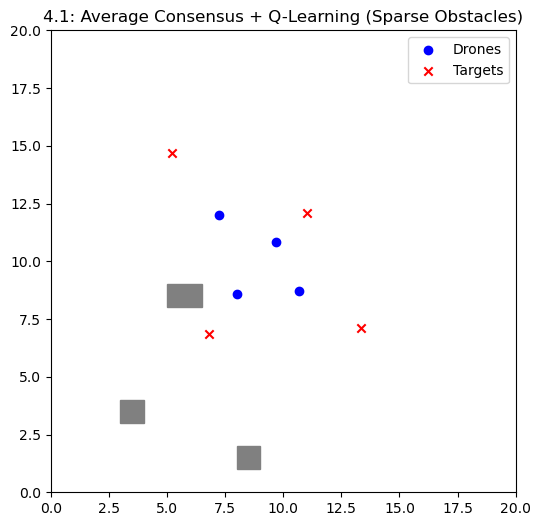

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Section 4.1: Average Consensus + Q-Learning with Sparse Polygonal Obstacles
# ============================================================================
np.random.seed(42)
n_drones = 4
positions = np.random.rand(n_drones, 2) * 10
targets = np.random.rand(n_drones, 2) * 10 + 5
stop_threshold = 0.1
learning_rate = 0.05

# Sparse polygonal obstacles
obstacles = [
    Polygon([[3, 3], [4, 3], [4, 4], [3, 4]], color='gray'),
    Polygon([[8, 1], [9, 1], [9, 2], [8, 2]], color='gray'),
    Polygon([[5, 8], [6.5, 8], [6.5, 9], [5, 9]], color='gray')
]

# Q-learning parameters
q_table = [np.zeros((8,)) for _ in range(n_drones)]
epsilon = 0.2
gamma = 0.9
q_alpha = 0.1
actions = np.array([
    [0, 0.5],   # N
    [0.5, 0.5], # NE
    [0.5, 0],   # E
    [0.5, -0.5],# SE
    [0, -0.5],  # S
    [-0.5, -0.5],# SW
    [-0.5, 0],  # W
    [-0.5, 0.5] # NW
])

arrived = np.array([False] * n_drones)
velocities = np.zeros_like(positions)

def point_inside_obstacle(point, polygon):
    return polygon.contains_point(point)

def choose_action(drone_id):
    if np.random.rand() < epsilon:
        return np.random.randint(0, 8)
    return np.argmax(q_table[drone_id])

def update_q_table(drone_id, action, reward, next_max):
    q_table[drone_id][action] = (1 - q_alpha) * q_table[drone_id][action] + q_alpha * (reward + gamma * next_max)

# Setup plot (for when you want to animate)
fig, ax = plt.subplots(figsize=(6,6))
sc = ax.scatter(positions[:,0], positions[:,1], c='blue', label='Drones')
target_sc = ax.scatter(targets[:,0], targets[:,1], c='red', marker='x', label='Targets')
for obs in obstacles:
    ax.add_patch(obs)
ax.set_xlim(0, 20)
ax.set_ylim(0, 20)
ax.legend()
ax.set_title('4.1: Average Consensus + Q-Learning (Sparse Obstacles)')

# Animation logic
is_paused = False
def on_click(event):
    global is_paused
    if event.inaxes is not None:
        is_paused = not is_paused

fig.canvas.mpl_connect('button_press_event', on_click)

def update(frame):
    global positions, velocities, arrived
    if not is_paused:
        for i in range(n_drones):
            if arrived[i]:
                continue
            neighbors = [j for j in range(n_drones) if j != i]
            avg_pos = np.mean(positions[neighbors], axis=0)
            consensus_dir = avg_pos - positions[i]
            target_dir = targets[i] - positions[i]
            direction = 0.5 * consensus_dir + 0.5 * target_dir

            action = choose_action(i)
            move = actions[action]
            trial_pos = positions[i] + move
            reward = -np.linalg.norm(targets[i] - trial_pos)

            for obs in obstacles:
                if point_inside_obstacle(trial_pos, obs):
                    reward -= 5

            next_max = np.max(q_table[i])
            update_q_table(i, action, reward, next_max)

            norm = np.linalg.norm(direction)
            if norm < stop_threshold:
                arrived[i] = True
                continue

            positions[i] += learning_rate * direction + 0.05 * move
        sc.set_offsets(positions)
    return sc,

# To animate in notebook (run manually when needed)
anim = FuncAnimation(fig, update, frames=500, interval=50, blit=True)
HTML(anim.to_jshtml())